In [1]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

import cell2location
import scvi

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text for PDFs
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Global seed set to 0
/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit defa

-----
anndata     0.9.1
scanpy      1.9.3
-----
PIL                 9.5.0
absl                NA
asttokens           NA
attr                23.1.0
backcall            0.2.0
cell2location       0.1.3
certifi             2023.05.07
charset_normalizer  3.1.0
chex                0.1.7
comm                0.1.3
contextlib2         NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.7
decorator           5.1.1
docrep              0.3.2
etils               1.3.0
executing           1.2.0
flax                0.6.10
fsspec              2023.5.0
h5py                3.8.0
idna                3.4
igraph              0.10.4
importlib_resources NA
ipykernel           6.23.0
jax                 0.4.10
jaxlib              0.4.10
jedi                0.18.2
joblib              1.2.0
kiwisolver          1.4.4
leidenalg           0.9.1
lightning_fabric    1.9.5
lightning_utilities 0.8.0
llvmlite            0.40.0
matplotlib          3.7.1
ml_collections  

In [2]:
results_folder = '/public/home/zhaox/spatial_analysis/'

# create paths and names to results folders for reference regression and cell2location models
ref_run_name = f'{results_folder}/reference_signatures'
run_name = f'{results_folder}/cell2location_map'

In [9]:
adata_vis = sc.read_visium("/public/home/zhaox/pigscRNA-seq/pig_spatial-seq/spatial_data/Adult_spatial.outs.tar/Adult_spatial.outs/outs/",
                      count_file="filtered_feature_bc_matrix.h5",
                      source_image_path="/public/home/zhaox/pigscRNA-seq/pig_spatial-seq/spatial_data/Adult_spatial.outs.tar/Adult_spatial.outs/outs/spatial/detected_tissue_image.jpg")
adata_vis.var_names_make_unique()
adata_vis

reading /public/home/zhaox/pigscRNA-seq/pig_spatial-seq/spatial_data/Adult_spatial.outs.tar/Adult_spatial.outs/outs/filtered_feature_bc_matrix.h5
 (0:00:01)


AnnData object with n_obs × n_vars = 4992 × 20907
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [10]:
adata_vis.var_names

Index(['LOC100125545', 'TBP', 'PSMB1', 'FAM120B', 'DLL1', 'LOC110259813',
       'LOC110259815', 'ERMARD', 'TCTE3', 'PHF10',
       ...
       'MT-COX2', 'MT-ATP8', 'MT-ATP6', 'MT-COX3', 'MT-ND3', 'MT-ND4L',
       'MT-ND4', 'MT-ND5', 'MT-ND6', 'MT-CYTB'],
      dtype='object', length=20907)

In [5]:
## adata_vis.var['SYMBOL'] = adata_vis.var_names
## adata_vis.var.set_index('gene_ids', drop=True, inplace=True)

In [12]:
adata_vis.var['SYMBOL'] = adata_vis.var_names

In [13]:
# find mitochondria-encoded (MT) genes
adata_vis.var['MT_gene'] = [gene.startswith('MT-') for gene in adata_vis.var['SYMBOL']]

# remove MT genes for spatial mapping (keeping their counts in the object)
adata_vis.obsm['MT'] = adata_vis[:, adata_vis.var['MT_gene'].values].X.toarray()
adata_vis = adata_vis[:, ~adata_vis.var['MT_gene'].values]
adata_vis

View of AnnData object with n_obs × n_vars = 4992 × 20893
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL', 'MT_gene'
    uns: 'spatial'
    obsm: 'spatial', 'MT'

In [14]:
adata_vis.var_names

Index(['LOC100125545', 'TBP', 'PSMB1', 'FAM120B', 'DLL1', 'LOC110259813',
       'LOC110259815', 'ERMARD', 'TCTE3', 'PHF10',
       ...
       'LOC100625764', 'LOC100626661', 'LOC110259197', 'LOC110259191',
       'LOC110259195', 'LOC110259193', 'LOC110259192', 'LOC100523800',
       'LOC100620803', 'LOC110259200'],
      dtype='object', length=20893)

In [15]:
adata_ref = sc.read("/public/home/zhaox/pigscRNA-seq/figures/adultreanalysis_annatation1221_rawforcellchat.h5ad")
adata_ref

AnnData object with n_obs × n_vars = 24967 × 19297
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_chrX', 'pct_counts_chrX', 'total_counts_chrY', 'pct_counts_chrY', 'S_score', 'G2M_score', 'phase', 'doublet', 'doublet_score', 'leiden', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chrX', 'chrY', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    obsp: 'connectivities', 'distances'

In [16]:
adata_ref.X.toarray()

array([[0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 2.6208186, ..., 0.       , 0.       ,
        0.       ],
       [0.7278692, 0.7278692, 0.7278692, ..., 0.       , 0.       ,
        0.       ],
       ...,
       [0.       , 0.       , 1.5322214, ..., 0.       , 0.       ,
        0.       ],
       [2.455274 , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ]], dtype=float32)

In [21]:
# print((adata_ref.X < 0).sum())
# print((adata_ref.X == 0).sum())

0


/public/home/zhaox/.local/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3508: SparseEfficiencyWarning: Comparing a sparse matrix with 0 using == is inefficient, try using != instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


446445968


In [17]:
adata_ref.X = adata_ref.X.astype(np.int64)

In [18]:
adata_ref.X.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 2, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 1, ..., 0, 0, 0],
       [2, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [19]:
# delete unnecessary raw slot (to be removed in a future version of the tutorial)
del adata_ref.raw

/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


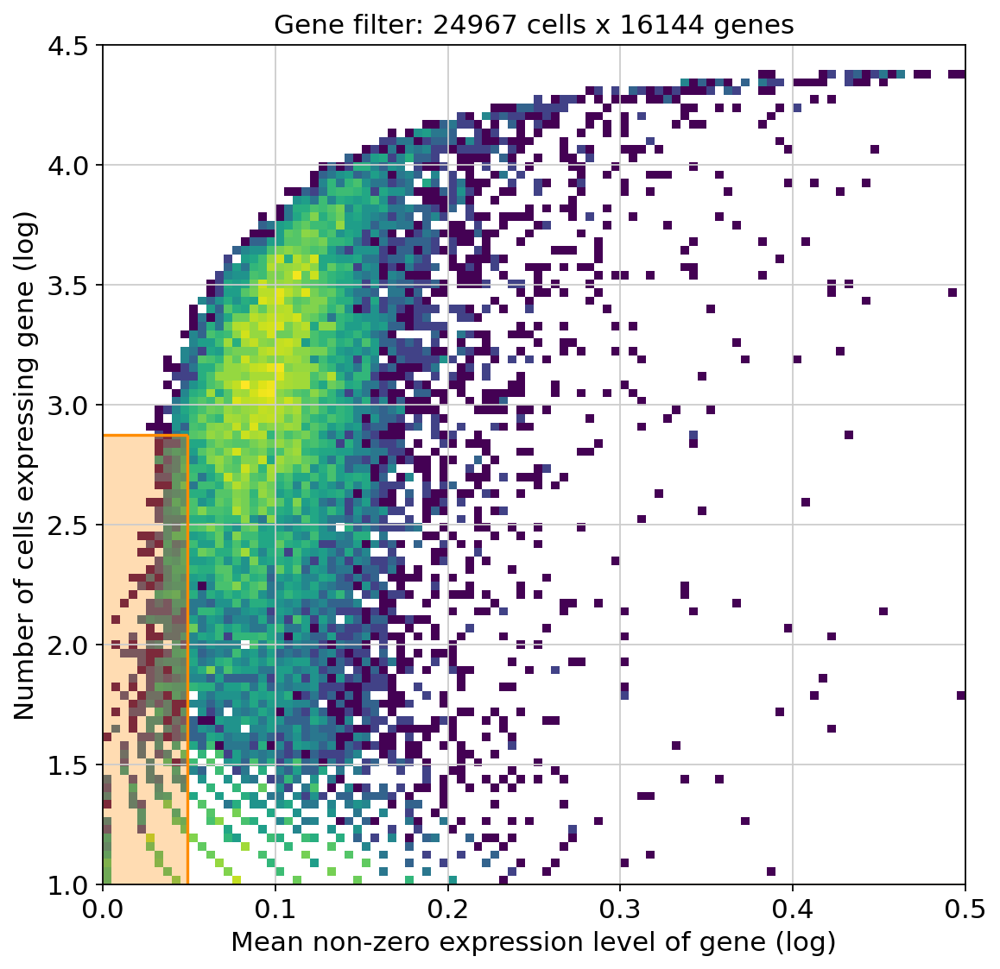

In [20]:
from cell2location.utils.filtering import filter_genes
selected = filter_genes(adata_ref, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
# filter the object
adata_ref = adata_ref[:, selected].copy()

In [21]:
# prepare anndata for the regression model
cell2location.models.RegressionModel.setup_anndata(adata=adata_ref,
                        # cell type, covariate used for constructing signatures
                        labels_key='cell_type'
                       )

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


In [22]:
from cell2location.models import RegressionModel
mod = RegressionModel(adata_ref)

# view anndata_setup as a sanity check
mod.view_anndata_setup()

Anndata setup with scvi-tools version 0.20.3.

Setup via `RegressionModel.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': None,
│   'labels_key': 'cell_type',
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   1   │
│         n_cells          │ 24967 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │  13   │
│          n_vars          │ 16144 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                     batch State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_batch'] │     0      │          0          │
└──────────────────────────┴────────────┴─────────────────────┘

                          labels State Registry                           
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃    Source Location     ┃       Categories        ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['cell_type'] │       Macrophage        │          0          │
│                        │         T cells         │          1          │
│                        │         B cells         │          2          │
│                        │    Endothelial cells    │          3          │
│                        │ Peritubular myoid cells │          4          │
│                        │      Sertoli cells      │          5          │
│                        │      Leydig cells       │          6          │
│                        │      Spermatogonia      │          7          │
│                        │      Spermatocytes      │          8          │
│                        │    Round spermatids     │          9          │
│                        │  Elongating spermatids  │         10          │
│                        │         others          │         11          │
│                        │         unknown         │         12          │
└────────────────────────┴─────────────────────────┴─────────────────────┘

In [23]:
mod.train(max_epochs=250,use_gpu=False)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/pytorch_lightning/trainer/configuration_validator.py:106: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")


Epoch 250/250: 100%|████████████████████████████████████████████████| 250/250 [4:25:53<00:00, 64.38s/it, v_num=1, elbo_train=9.72e+7]

`Trainer.fit` stopped: `max_epochs=250` reached.


Epoch 250/250: 100%|████████████████████████████████████████████████| 250/250 [4:25:53<00:00, 63.81s/it, v_num=1, elbo_train=9.72e+7]


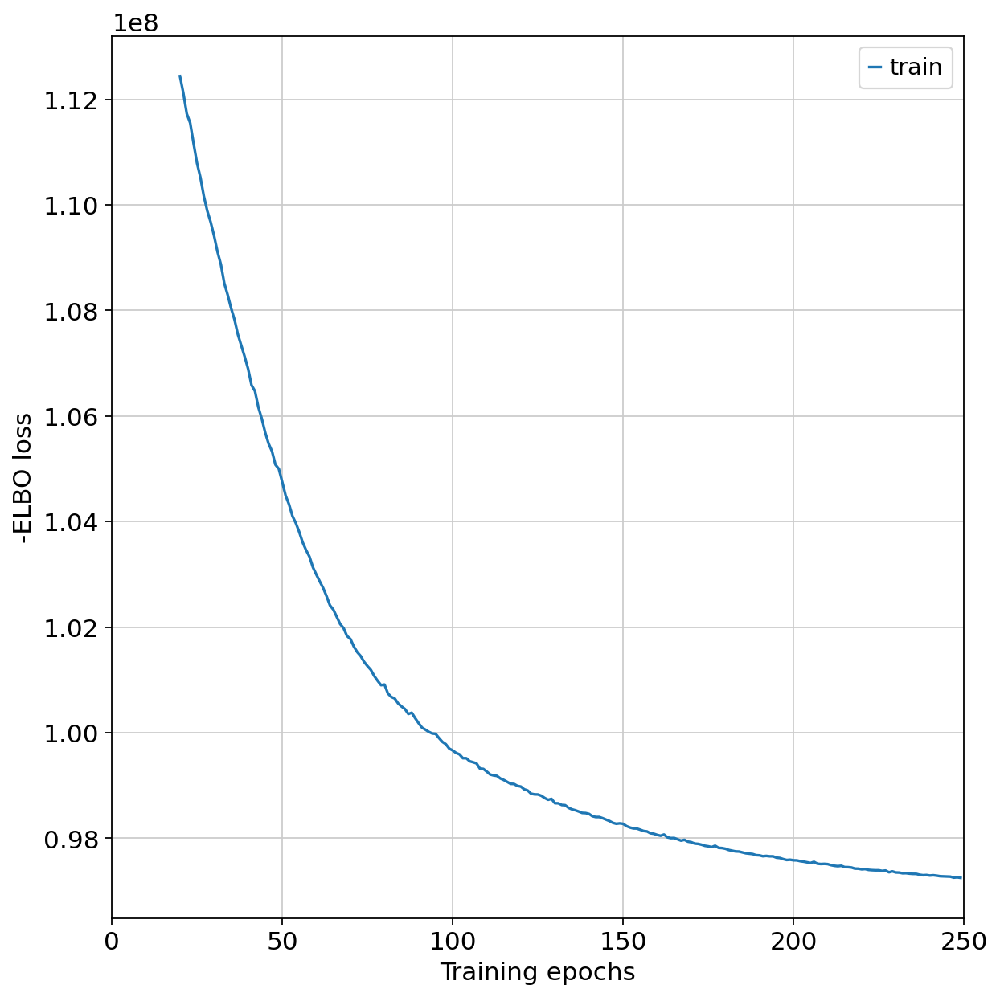

In [24]:
mod.plot_history(20)

In [25]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_ref = mod.export_posterior(
    adata_ref, sample_kwargs={'num_samples': 1000, 'use_gpu': False}
)

# Save model
mod.save(f"{ref_run_name}", overwrite=True)

# Save anndata object with results
adata_file = f"{ref_run_name}/sc.h5ad"
adata_ref.write(adata_file)
adata_file

Sampling global variables, sample: 100%|███████████████████████████████████████████████████████████| 999/999 [11:20<00:00,  1.47it/s]


'/public/home/zhaox/spatial_analysis//reference_signatures/sc.h5ad'

In [26]:
adata_ref = mod.export_posterior(
    adata_ref, use_quantiles=True,
    # choose quantiles
    add_to_varm=["means", "stds", "q05", "q95"],
    sample_kwargs={'use_gpu': False}
)

In [27]:
adata_file = f"{ref_run_name}/sc.h5ad"
adata_ref = sc.read_h5ad(adata_file)
mod = cell2location.models.RegressionModel.load(f"{ref_run_name}", adata_ref)

INFO     File /public/home/zhaox/spatial_analysis//reference_signatures/model.pt already downloaded                


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/pytorch_lightning/trainer/configuration_validator.py:106: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")


Epoch 1/801:   0%|                                                    | 1/801 [00:05<1:15:04,  5.63s/it, v_num=1, elbo_train=1.21e+8]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/801:   0%|                                                    | 1/801 [00:05<1:15:11,  5.64s/it, v_num=1, elbo_train=1.21e+8]


In [28]:
adata_ref

AnnData object with n_obs × n_vars = 24967 × 16144
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_chrX', 'pct_counts_chrX', 'total_counts_chrY', 'pct_counts_chrY', 'S_score', 'G2M_score', 'phase', 'doublet', 'doublet_score', 'leiden', 'cell_type', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chrX', 'chrY', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_cells', 'nonz_mean'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'mod', 'neighbors', 'pca', 'rank_genes_groups', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'means_per_cluster_mu_fg', 'q05_per_cluster_mu_fg', 'q95_per_cluster_mu_fg', 'stds_per_cluster_mu_fg'
    obsp: 'connectivities', 'distances'

In [29]:
adata_vis

View of AnnData object with n_obs × n_vars = 4992 × 20893
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL', 'MT_gene'
    uns: 'spatial'
    obsm: 'spatial', 'MT'

In [30]:
# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']
inf_aver.iloc[0:5, 0:5]

,Macrophage,T cells,B cells,Endothelial cells,Peritubular myoid cells
LOC100125545,0.014587,0.028577,0.039176,0.019676,0.026782
TBP,0.007725,0.014076,0.025359,0.007512,0.014556
PSMB1,0.374656,0.188090,0.321357,0.457320,0.501638
FAM120B,0.008621,0.006697,0.023697,0.030278,0.066032
DLL1,0.004749,0.001132,0.019308,0.065488,0.001085


In [ ]:
# Cell2location: spatial mapping

In [31]:
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
adata_vis = adata_vis[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for cell2location model
cell2location.models.Cell2location.setup_anndata(adata=adata_vis)

In [32]:
# create and train the model
mod = cell2location.models.Cell2location(
    adata_vis, cell_state_df=inf_aver,
    # the expected average cell abundance: tissue-dependent
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=30,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection:
    detection_alpha=20
)
mod.view_anndata_setup()

Anndata setup with scvi-tools version 0.20.3.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': None,
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   1   │
│         n_cells          │ 4992  │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 16143 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                     batch State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_batch'] │     0      │          0          │
└──────────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

In [94]:
print((adata_ref.X < 0).sum())
print((adata_ref.X == 0).sum())

0


/public/home/zhaox/.local/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3508: SparseEfficiencyWarning: Comparing a sparse matrix with 0 using == is inefficient, try using != instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


373945523


In [97]:
adata_vis.X.toarray()

array([], shape=(4992, 0), dtype=float32)

In [33]:
mod.train(max_epochs=30000,
          # train using full data (batch_size=None)
          batch_size=None,
          # use all data points in training because
          # we need to estimate cell abundance at all locations
          use_gpu=False,
         )

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/pytorch_lightning/trainer/configuration_validator.py:106: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/pytorch_lightning/trainer/trainer.py:1609: PossibleUserWarning: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Epoch 30000/30000: 100%|██████████████████████████████████████| 30000/30000 [107:04:51<00:00, 10.42s/it, v_num=1, elbo_train=5.19e+7]

`Trainer.fit` stopped: `max_epochs=30000` reached.


Epoch 30000/30000: 100%|██████████████████████████████████████| 30000/30000 [107:04:51<00:00, 12.85s/it, v_num=1, elbo_train=5.19e+7]


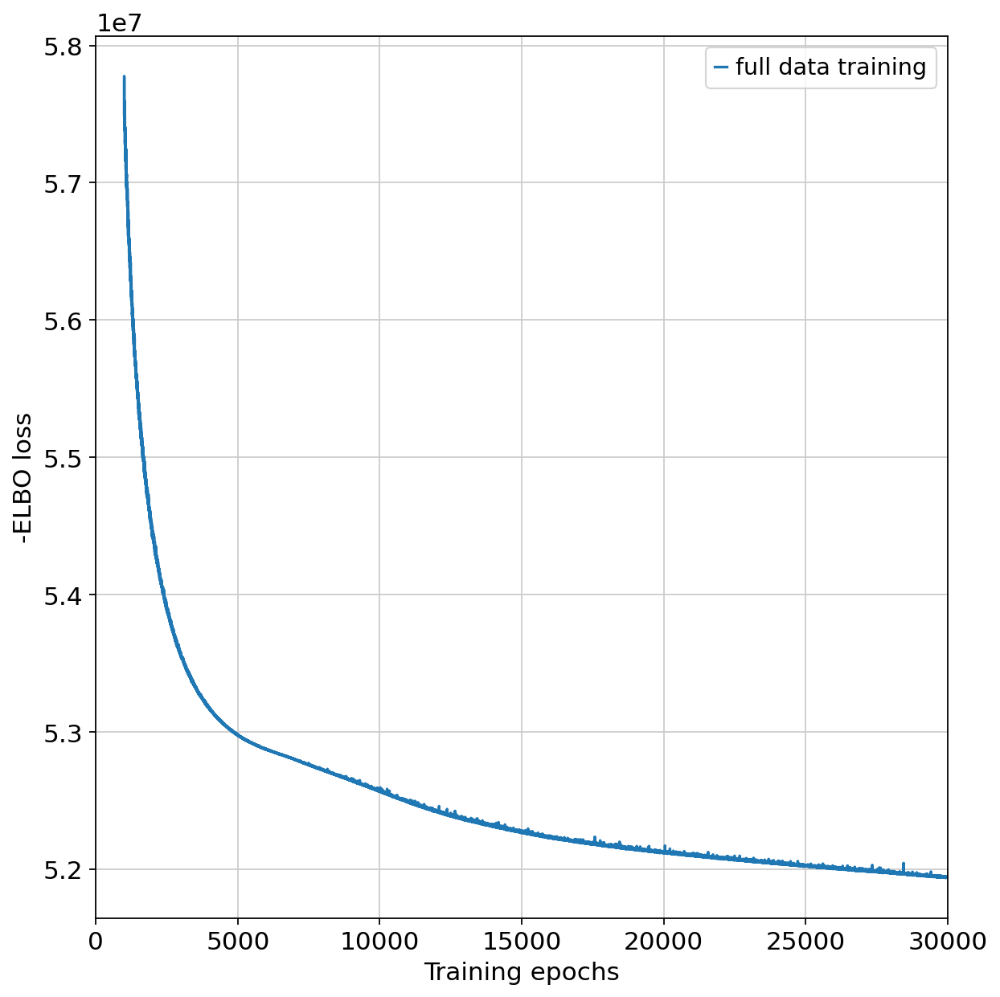

In [34]:
# plot ELBO loss history during training, removing first 100 epochs from the plot
mod.plot_history(1000)
plt.legend(labels=['full data training']);

In [35]:
adata_vis = mod.export_posterior(
    adata_vis, sample_kwargs={'num_samples': 1000, 'use_gpu': False}
)

# Save model
mod.save(f"{run_name}", overwrite=True)

# mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

# Save anndata object with results
adata_file = f"{run_name}/sp.h5ad"
adata_vis.write(adata_file)
adata_file

Sampling global variables, sample: 100%|███████████████████████████████████████████████████████████| 999/999 [09:13<00:00,  1.80it/s]


'/public/home/zhaox/spatial_analysis//cell2location_map/sp.h5ad'

In [ ]:
# The model and output h5ad can be loaded later like this:
adata_file = f"{run_name}/sp.h5ad"
adata_vis = sc.read_h5ad(adata_file)
mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

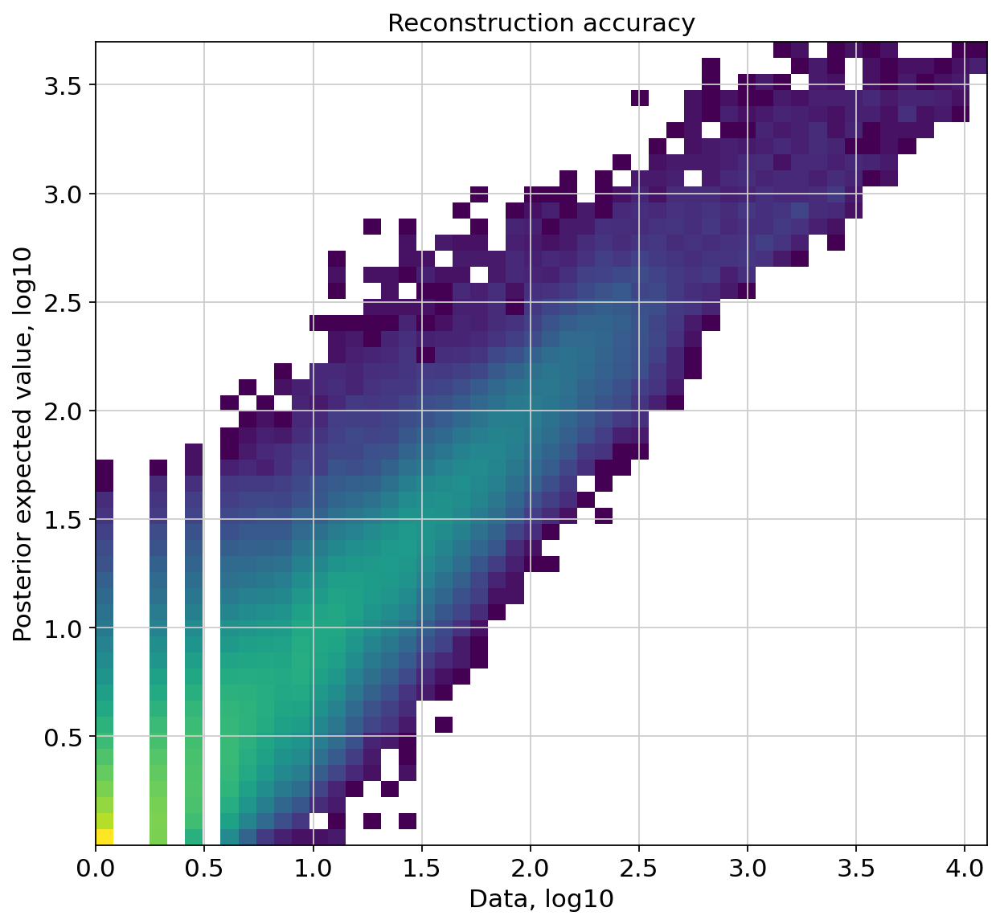

In [36]:
mod.plot_QC()

In [ ]:
# Visualising cell abundance in spatial coordinates

In [38]:
adata_vis.obsm

AxisArrays with keys: spatial, MT, means_cell_abundance_w_sf, stds_cell_abundance_w_sf, q05_cell_abundance_w_sf, q95_cell_abundance_w_sf

In [39]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']

In [40]:
adata_vis

AnnData object with n_obs × n_vars = 4992 × 16143
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'total RNA counts', 'Macrophage', 'T cells', 'B cells', 'Endothelial cells', 'Peritubular myoid cells', 'Sertoli cells', 'Leydig cells', 'Spermatogonia', 'Spermatocytes', 'Round spermatids', 'Elongating spermatids', 'others', 'unknown'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL', 'MT_gene'
    uns: 'spatial', '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    obsm: 'spatial', 'MT', 'means_cell_abundance_w_sf', 'stds_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf'

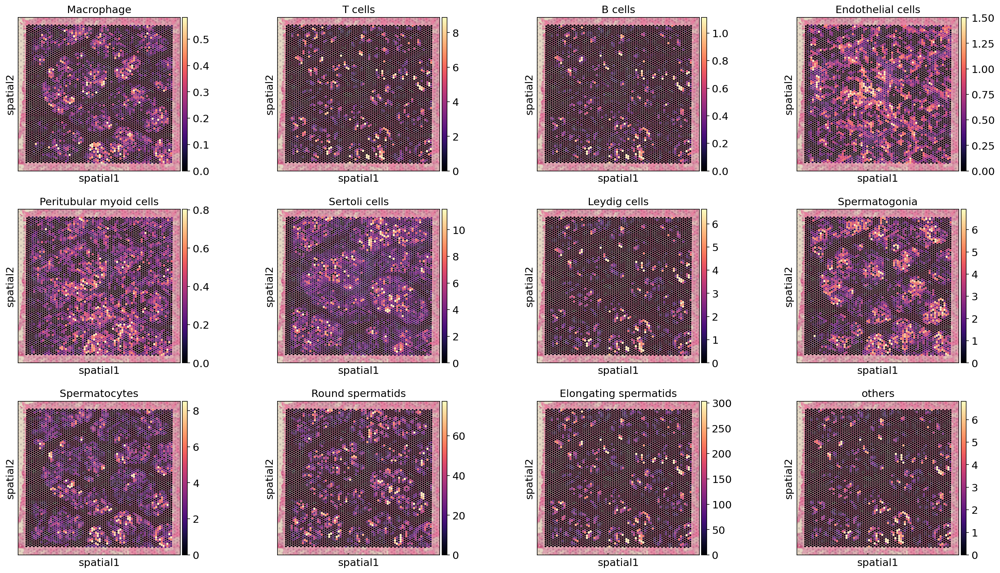

In [47]:
# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [5, 4]}):

    sc.pl.spatial(adata_vis, cmap='magma',
                  # show first 8 cell types
                  color=['Macrophage', 'T cells', 'B cells', 'Endothelial cells', 'Peritubular myoid cells', 'Sertoli cells', 'Leydig cells',
                         'Spermatogonia', 'Spermatocytes', 'Round spermatids', 'Elongating spermatids', 'others'],
                  ncols=4, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2',
                  save='adultspatial_cell2location_celltype0527.pdf'
                 )

In [48]:
adata_vis

AnnData object with n_obs × n_vars = 4992 × 16143
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'total RNA counts', 'Macrophage', 'T cells', 'B cells', 'Endothelial cells', 'Peritubular myoid cells', 'Sertoli cells', 'Leydig cells', 'Spermatogonia', 'Spermatocytes', 'Round spermatids', 'Elongating spermatids', 'others', 'unknown'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL', 'MT_gene'
    uns: 'spatial', '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    obsm: 'spatial', 'MT', 'means_cell_abundance_w_sf', 'stds_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf'

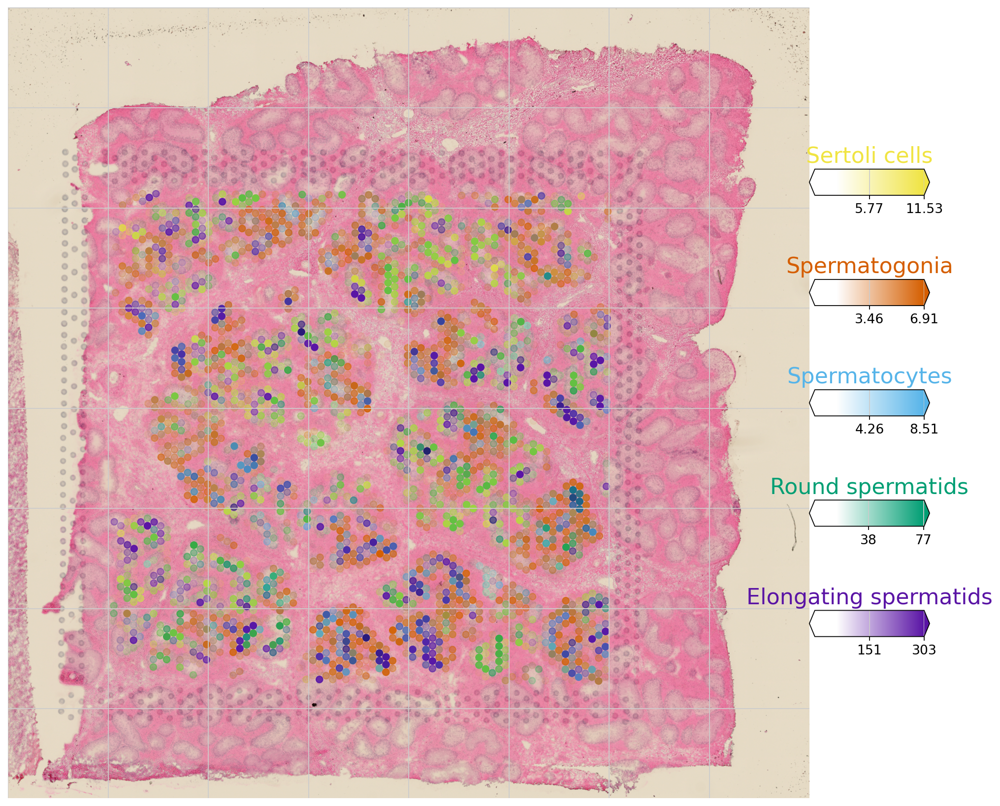

In [50]:
# Now we use cell2location plotter that allows showing multiple cell types in one panel
from cell2location.plt import plot_spatial

# select up to 6 clusters
clust_labels = ['Sertoli cells', 'Spermatogonia','Spermatocytes', 'Round spermatids', 'Elongating spermatids']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=adata_vis,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        colorbar_position='right'
    )
    plt.savefig("adultspatial_cell2location_multiple_celltypes0527.pdf")

In [51]:
## Downstream analysis
# Identifying discrete tissue regions by Leiden clustering
# compute KNN using the cell2location output stored in adata.obsm
sc.pp.neighbors(adata_vis, use_rep='q05_cell_abundance_w_sf',
                n_neighbors = 15)

# Cluster spots into regions using scanpy
sc.tl.leiden(adata_vis, resolution=1.1)

# add region as categorical variable
adata_vis.obs["region_cluster"] = adata_vis.obs["leiden"].astype("category")

computing neighbors


/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:27)


/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


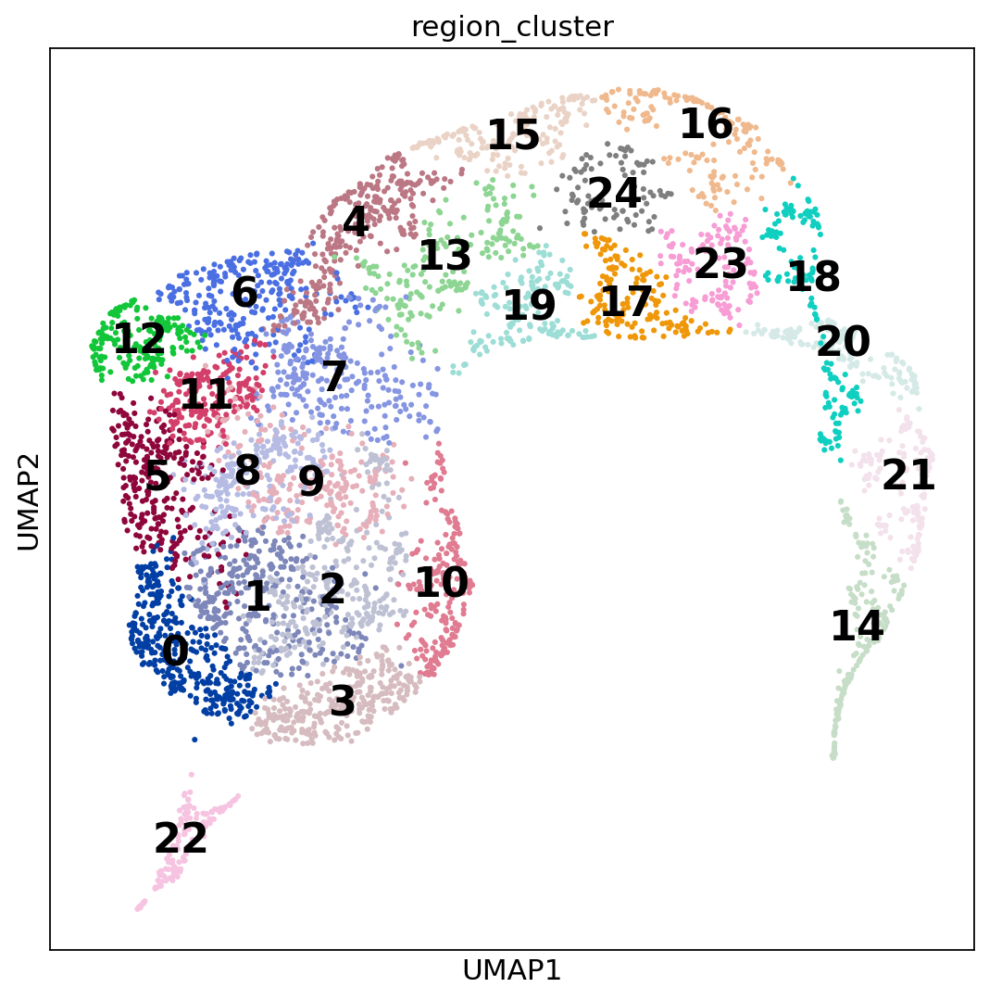

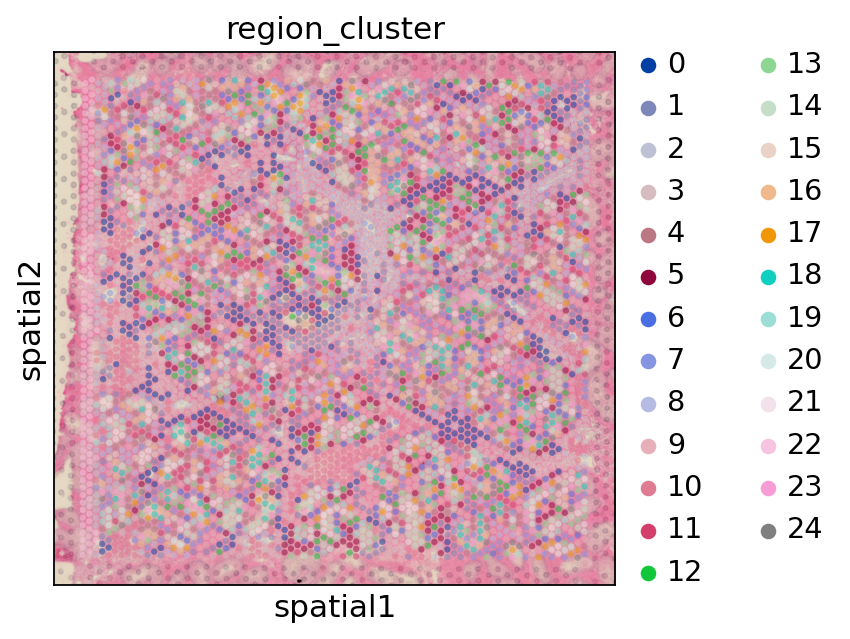

In [53]:
# compute UMAP using KNN graph based on the cell2location output
sc.tl.umap(adata_vis, min_dist = 0.3, spread = 1)

# show regions in UMAP coordinates
with mpl.rc_context({'axes.facecolor':  'white',
                     'figure.figsize': [8, 8]}):
    sc.pl.umap(adata_vis, color=['region_cluster'], size=30,
               color_map = 'RdPu', ncols = 2, legend_loc='on data',
               legend_fontsize=20,
               save='adultspatial_cell2location_leiden0527.pdf')

# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):
    sc.pl.spatial(adata_vis, color=['region_cluster'], 
                  size=1.3, img_key='hires', alpha=0.5,
               save='adultspatial_cell2location_spatialleiden0527.pdf')

In [57]:
# Identifying cellular compartments / tissue zones using matrix factorisation (NMF)
from cell2location import run_colocation
res_dict, adata_vis = run_colocation(
    adata_vis, 
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(11, 13), # IMPORTANT: use a wider range of the number of factors (5-30)           
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/CoLocatedComb/'}
) 

### Analysis name: CoLocatedGroupsSklearnNMF_11combinations_4992locations_13factors


/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


### Analysis name: CoLocatedGroupsSklearnNMF_12combinations_4992locations_13factors


/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/public/home/zhaox/anaconda3/envs/cell2location/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


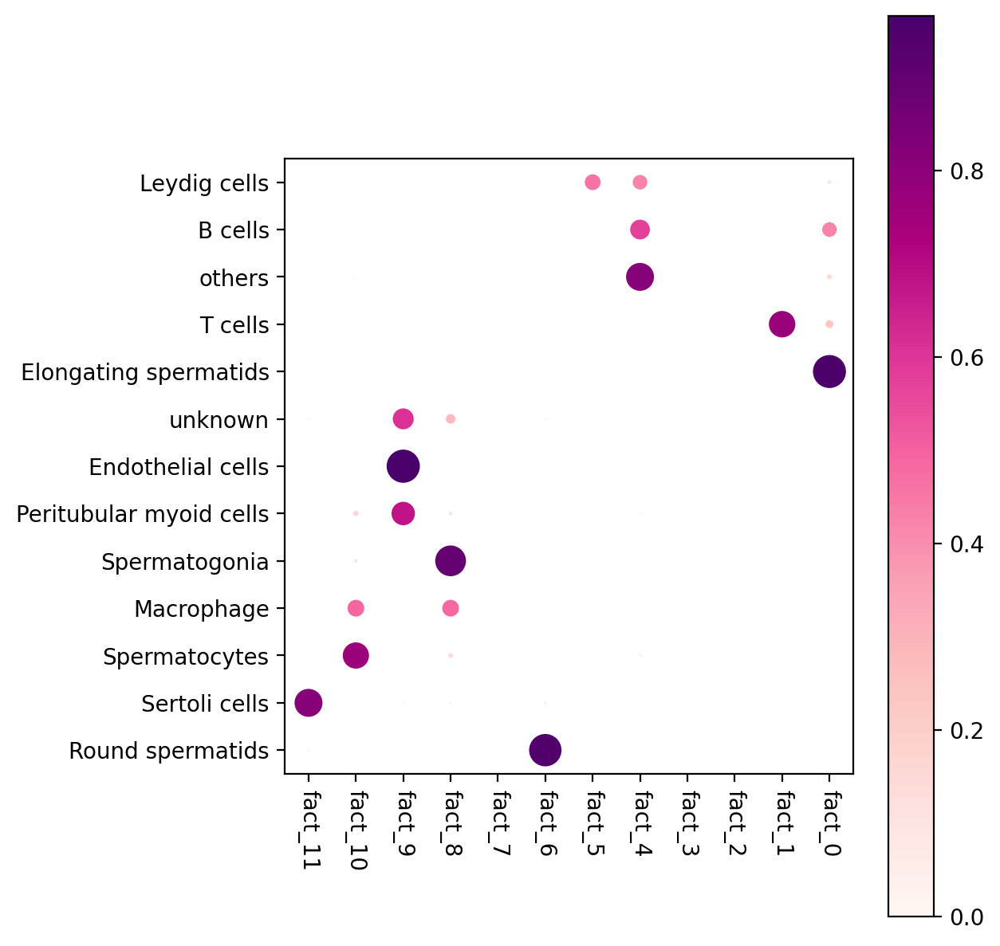

In [61]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
res_dict['n_fact12']['mod'].plot_cell_type_loadings()
plt.savefig("adultspatial_cell2location_NMFweights0527.pdf")

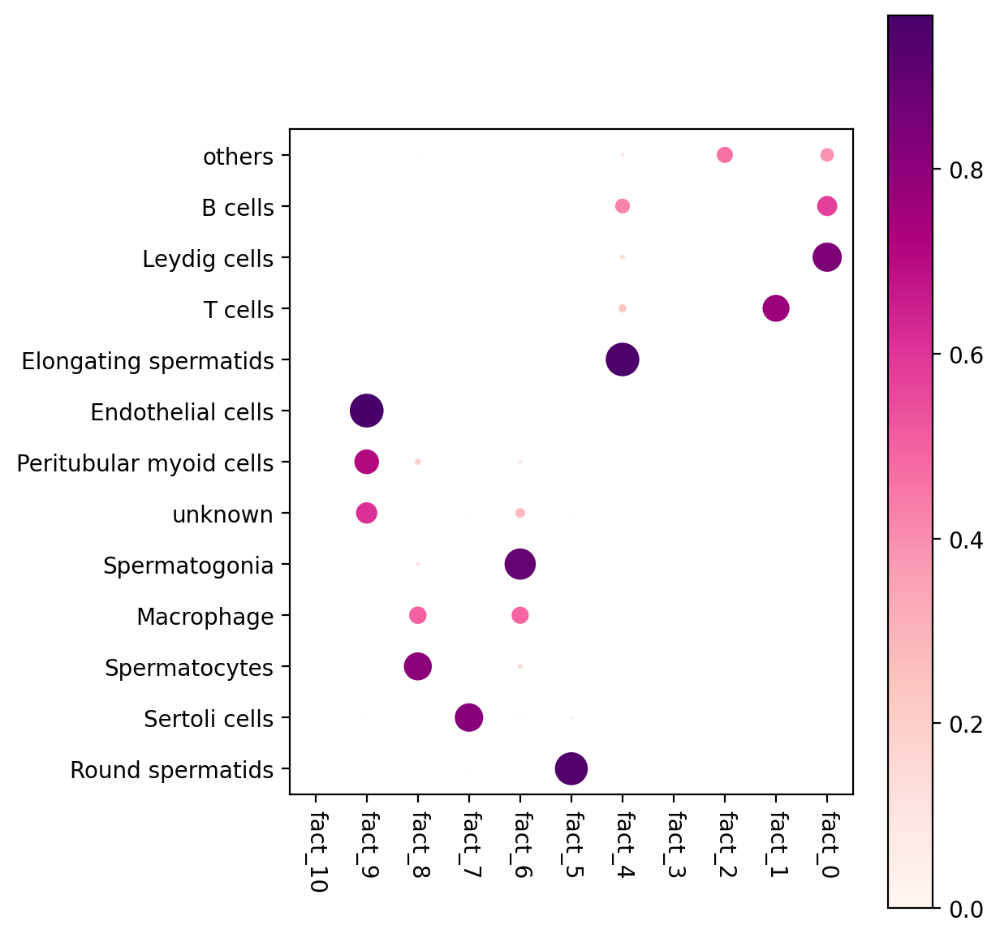

In [62]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
res_dict['n_fact11']['mod'].plot_cell_type_loadings()
plt.savefig("adultspatial_cell2location_NMFweights_nfact110527.pdf")

In [65]:
# Estimate cell-type specific expression of every gene in the spatial data (needed for NCEM)
# Compute expected expression per cell type
expected_dict = mod.module.model.compute_expected_per_cell_type(
    mod.samples["post_sample_q05"], mod.adata_manager
)

In [66]:
# Add to anndata layers
for i, n in enumerate(mod.factor_names_):
    adata_vis.layers[n] = expected_dict['mu'][i]

# Save anndata object with results
adata_file = f"{run_name}/sp.h5ad"
adata_vis.write(adata_file)
adata_file

'/public/home/zhaox/spatial_analysis//cell2location_map/sp.h5ad'

In [68]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np

def plot_genes_per_cell_type(adata_vis, genes, ctypes):
    n_genes = len(genes)
    n_ctypes = len(ctypes)
    fig, axs = plt.subplots(
        nrows=n_genes, ncols=n_ctypes + 1, figsize=(4.5 * (n_ctypes + 1) + 2, 5 * n_genes + 1), squeeze=False
    )
    # axs = axs.reshape((n_genes, n_ctypes+1))
    # plots of every gene
    for j in range(n_genes):
        # limit color scale at 99.2% quantile of gene expression (computed across cell types)
        quantile_across_ct = np.array(
            [
                np.quantile(adata_vis.layers[n][:, adata_vis.var["SYMBOL"] == genes[j]].toarray(), 0.992)
                for n in adata_vis.uns["mod"]["factor_names"]
            ]
        )
        quantile_across_ct = np.partition(quantile_across_ct.flatten(), -2)[-2]
        sc.pl.spatial(
            adata_vis,
            cmap="magma",
            color=genes[j],
            # layer=ctypes[i],
            gene_symbols="SYMBOL",
            ncols=4,
            size=1.3,
            img_key="hires",
            # limit color scale at 99.2% quantile of gene expression
            vmin=0,
            vmax="p99.2",
            ax=axs[j, 0],
            show=False,
        )

        # plots of every cell type
        for i in range(n_ctypes):
            sc.pl.spatial(
                adata_vis,
                cmap="magma",
                color=genes[j],
                layer=ctypes[i],
                gene_symbols="SYMBOL",
                ncols=4,
                size=1.3,
                img_key="hires",
                # limit color scale at 99.2% quantile of gene expression
                vmin=0,
                vmax=quantile_across_ct,
                ax=axs[j, i + 1],
                show=False,
            )
            axs[j, i + 1].set_title(f"{genes[j]} {ctypes[i]}")

    return fig, axs

In [ ]:
# list cell types and genes for plotting
ctypes = ['Spermatogonia', 'Spermatocytes', 'Round spermatids','Elongating spermatids','Sertoli cells']
genes = ['UCHL1', 'SYCP3', 'ACRV1', 'PRM1']

with mpl.rc_context({'axes.facecolor':  'black'}):
    plot_genes_per_cell_type(adata_vis, genes, ctypes)
    plt.savefig("adultspatial_cell2location_genes_celltype0527.pdf")

In [54]:
adata_vis.obs

,in_tissue,array_row,array_col,_indices,_scvi_batch,_scvi_labels,total RNA counts,Macrophage,T cells,B cells,...,Sertoli cells,Leydig cells,Spermatogonia,Spermatocytes,Round spermatids,Elongating spermatids,others,unknown,leiden,region_cluster
AAACAACGAATAGTTC-1,1,0,16,0,0,0,6776.0,0.002950,0.032101,0.009774,...,1.366551,0.000952,0.174471,0.004708,1.264577,1.062638,0.003499,0.011750,1,1
AAACAAGTATCTCCCA-1,1,50,102,1,0,0,40249.0,0.010974,1.656809,0.151932,...,2.695209,1.672750,0.054689,0.783769,42.023467,82.648475,1.555210,0.009777,18,18
AAACAATCTACTAGCA-1,1,3,43,2,0,0,27703.0,0.023938,0.150635,0.003797,...,4.404163,0.013911,0.412230,3.063361,9.256647,2.372312,0.293132,0.003263,4,4
AAACACCAATAACTGC-1,1,59,19,3,0,0,7130.0,0.056438,0.025144,0.021213,...,1.998149,0.001415,1.013929,0.191433,1.137095,0.323232,0.002897,0.081887,8,8
AAACAGAGCGACTCCT-1,1,14,94,4,0,0,36675.0,0.114143,0.000236,0.000644,...,4.305355,0.072126,3.928800,2.031918,11.877874,0.780464,0.019532,0.015970,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1,1,58,42,4987,0,0,28627.0,0.004590,0.000206,0.000100,...,8.828476,0.000259,0.109813,0.087283,62.903043,0.006445,0.003882,0.023776,16,16
TTGTTTCATTAGTCTA-1,1,60,30,4988,0,0,4236.0,0.000109,0.066371,0.090069,...,0.024346,0.165803,0.002513,0.001274,0.010887,2.493234,0.247855,0.000689,10,10
TTGTTTCCATACAACT-1,1,45,27,4989,0,0,2533.0,0.001217,0.116595,0.001101,...,0.900856,0.005774,0.006630,0.000710,0.951451,0.234604,0.004288,0.012268,2,2
TTGTTTGTATTACACG-1,1,73,41,4990,0,0,1716.0,0.010998,0.032676,0.014683,...,0.875919,0.002493,0.019590,0.000682,0.019196,1.439637,0.002772,0.019931,0,0


In [71]:
adata_vis

AnnData object with n_obs × n_vars = 4992 × 16143
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'total RNA counts', 'Macrophage', 'T cells', 'B cells', 'Endothelial cells', 'Peritubular myoid cells', 'Sertoli cells', 'Leydig cells', 'Spermatogonia', 'Spermatocytes', 'Round spermatids', 'Elongating spermatids', 'others', 'unknown', 'leiden', 'region_cluster', 'sample', 'mean_nUMI_factorsfact_0', 'mean_nUMI_factorsfact_1', 'mean_nUMI_factorsfact_2', 'mean_nUMI_factorsfact_3', 'mean_nUMI_factorsfact_4', 'mean_nUMI_factorsfact_5', 'mean_nUMI_factorsfact_6', 'mean_nUMI_factorsfact_7', 'mean_nUMI_factorsfact_8', 'mean_nUMI_factorsfact_9', 'mean_nUMI_factorsfact_10', 'mean_nUMI_factorsfact_11'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL', 'MT_gene'
    uns: 'spatial', '_scvi_uuid', '_scvi_manager_uuid', 'mod', 'neighbors', 'leiden', 'umap', 'region_cluster_colors', 'mod_coloc_n_fact11', 'mod_coloc_n_fact12'
    obsm: 'spatial', 'MT', 'm